In [1]:
# google colab. 

from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


# **( 1.0 ) NECESSARY LIBRARIES & INSTALLATIONS**

In [2]:
#Necessary Installations
!pip install --upgrade tf_slim 
#defining, training and evaluating neural networks simple: ... Slim makes it easy to extend complex models, and to warm start training algorithms by using pieces of pre-existing model checkpoints.

     |████████████████████████████████| 352 kB 33.8 MB/s 


In [3]:
!sudo pip install mtcnn

     |████████████████████████████████| 2.3 MB 36.8 MB/s 


In [4]:
!pip install flask-ngrok

In [5]:
# confirm mtcnn was installed correctly
import mtcnn
# print version
print(mtcnn.__version__)

0.1.0


In [6]:
# Necessary Libraries.

from PIL import Image, ImageOps 
from matplotlib import pyplot
from google.colab.patches import cv2_imshow
from matplotlib.patches import Rectangle
import os.path 
from os import listdir
from keras.models import load_model
import numpy as np 
import tensorflow as tf
from numpy import asarray
import matplotlib as mp
%matplotlib inline
import matplotlib.pyplot as plt
from keras.callbacks import ModelCheckpoint, EarlyStopping
import skimage
import scipy
import tf_slim as slim # tF-Slim is a library that makes defining, training and evaluating neural networks simple:
#from tensorflow.python.compiler.tensorrt import trt_convert as trt
import math
from PIL import Image
from scipy.ndimage import rotate
from os import mkdir
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
from scipy import stats
from keras.utils.np_utils import to_categorical 
import sklearn
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import confusion_matrix
from keras.models import Sequential, model_from_json
from keras.layers import Dense, Conv2D, Activation, MaxPool2D, Flatten, Dropout, BatchNormalization
from keras.optimizers import RMSprop,Adam
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical 
from flask_ngrok import run_with_ngrok
from flask import Flask, render_template, request, url_for, redirect, flash
import cv2
from mtcnn.mtcnn import MTCNN
from werkzeug.utils import secure_filename

# **( 1.0 ) TRUE DETECTIVE WEB**

using FLASK

In [7]:
#Loading the face dataset.
#'/content/True-Detective-Aligned-faces-dataset.npz'
faceData = np.load('/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/True-Detective-Aligned-faces-dataset.npz')
X_Train, Y_Train, X_Test, Y_Test = faceData ['arr_0'] ,faceData ['arr_1'] ,faceData ['arr_2'] ,faceData ['arr_3']
print('Loaded: Train: ', X_Train.shape, Y_Train.shape, ' Test: ',X_Test.shape, Y_Test.shape)

# Test normalization
print(X_Test.shape)
X_Test = X_Test / 255.0
print("X_test shape: ",X_Test.shape)

# Reshaping   x test.
X_Test = np.expand_dims(X_Test, axis=3)
X_TEST = np.empty((1387, 96, 96, 1))

for k in range(X_Test.shape[0]):
    X_TEST[k] = X_Test[k]

print("X_train shape: ",X_Test.shape)
print("X_TRAIN shape: ",X_TEST.shape)

Loaded: Train:  (813, 96, 96) (813, 11)  Test:  (1387, 96, 96) (1387, 11)
(1387, 96, 96)
X_test shape:  (1387, 96, 96)
X_train shape:  (1387, 96, 96, 1)
X_TRAIN shape:  (1387, 96, 96, 1)


In [8]:
Y_Set = []
for i in range(1387): #X_test.shape[0]
  if i>= 0 and i<76:
    Y_Set.append(8) #anas
  elif i>= 76 and i < 201:
    Y_Set.append(2) #laiba
  elif i>= 201 and i < 405:
    Y_Set.append(4) # abdurrafay
  elif i>= 405 and i < 497:
    Y_Set.append(7) #hassan
  elif i>= 497 and i < 587:
    Y_Set.append(6) #musaab
  elif i>= 587 and i < 700:
    Y_Set.append(5) #zaryab
  elif i>= 700 and i < 901:
    Y_Set.append(0) #huraira
  elif i>= 901 and i < 993:
    Y_Set.append(1) #ruhma
  elif i>= 993 and i < 1130:
    Y_Set.append(3) #ibrahim
  elif i>= 1130 and i < 1268:
    Y_Set.append(9) #saad
  elif i>= 1268 and i < 1387:
    Y_Set.append(10) #munzar

Y_test=np.array(Y_Set)
print(Y_test.shape)
print(Y_test[1386])

Y_test = to_categorical(Y_test, num_classes = 11)

print(Y_test.shape)
print(Y_test[0])

(1387,)
10
(1387, 11)
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]


In [9]:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
# load json and create model
json_file = open('/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/dcnn1.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
dcnn1 = model_from_json(loaded_model_json)
# load weights into new model
dcnn1.load_weights("/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/dcnn1.h5")
print("Loaded model from disk")
 
# evaluate loaded model on test data
dcnn1.compile(optimizer = optimizer, loss = "categorical_crossentropy", metrics=["accuracy"])
score = dcnn1.evaluate(X_TEST, Y_Test, verbose=0) # no need for fit.
print("Test Loss:",score[0])
print("Test Accuracy:",score[1]*100)

Loaded model from disk
Test Loss: 0.04891958460211754
Test Accuracy: 98.48594069480896


In [10]:
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.pop()
dcnn1.build()

In [11]:
# load json and create model
json_file = open('/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/dcnn2.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
dcnn2 = model_from_json(loaded_model_json)
# load weights into new model
dcnn2.load_weights("/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/dcnn2.h5")
print("Loaded model from disk")
 
# evaluate loaded model on test data
dcnn2.compile(optimizer = optimizer, loss = "categorical_crossentropy", metrics=["accuracy"])
score = dcnn2.evaluate(X_TEST, Y_Test, verbose=0) # no need for fit.
print("Test Loss:",score[0])
print("Test Accuracy:",score[1]*100)

Loaded model from disk
Test Loss: 3.7758100032806396
Test Accuracy: 38.57245743274689


In [12]:
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.pop()
dcnn2.build()

In [13]:
#Loading the face dataset.
# 'cnn-trainFeat-testFeat.npz'
faceData = np.load('/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/cnn-trainFeat-testFeat.npz')
Xtrain_feats1, Test_Feat1= faceData ['arr_0'] ,faceData ['arr_1'] 
print('Loaded: Train: ', Xtrain_feats1.shape, Test_Feat1.shape)

Loaded: Train:  (813, 12, 12, 256) (1387, 12, 12, 256)


In [14]:
# load json and create model
json_file = open('/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/cnn.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
cnn = model_from_json(loaded_model_json)
# load weights into new model
cnn.load_weights("/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/cnn.h5")
print("Loaded model from disk")
 
# evaluate loaded model on test data
cnn.compile(optimizer = optimizer, loss = "categorical_crossentropy", metrics=["accuracy"])
score = cnn.evaluate(Test_Feat1,Y_Test, verbose=0) # no need for 'fit'.
print("Test Loss:",score[0])
print("Test Accuracy:",score[1]*100)

Loaded model from disk
Test Loss: 2.1701197624206543
Test Accuracy: 74.1167962551117


  '''
    #debug
    print('request.method', request.method)
    print('request.args', request.args)
    print('request.form', request.form)
    print('request.files', request.files)
  '''

In [15]:
# extract a single face from a given photograph
def extract_face(pixels, detector,subdir,fn, f_type, required_size=(96, 96)):
  # load image from file.
	##image = Image.open(filename) #img = Image.open(image)
	#print("image o size ",img.size) #(3000, 4000)

  # Rotate Specific Img for Detection.
	if (subdir == "P5-Huraira" or subdir == "P6-HassanIqbal" or subdir == "P7-Zaryab" or subdir == "P8-IbrahimTahir" or subdir == "P9-Anas" or subdir == "P10-Musaab" or subdir == "P11-Munzar" or (subdir == "P3-SaadMalik" and fn[0]=='f' ) or (subdir == "P2-RuhmaTariq" and fn[0]=='f' )  ):
		image = image.rotate(270)

	# convert to array.
	##pixels = asarray(image)
 
  # MTCNN Detector arg passed, detect faces in the image.
	results = detector.detect_faces(pixels)
 
	# Drawing boxes for the faces detected & Display.
	pyplot.imshow(pixels)
	ax = pyplot.gca() # getting context for drawing the boxes.
	# plot each box on each face.
	for result in results:
		x, y, w, h = result['box'] # getting coordinates.
		# create the shape
		rect = Rectangle((x, y), w, h, fill=False, color='red')
		# draw the box
		ax.add_patch(rect)
	pyplot.show()

	# Extract the bounding box from the first face so forth all the faces.
	numFaces = len(results) # total faces detected in an image.
	#print(numFaces)
	faces=[]
	for i in range(numFaces): # Save the locality of each face in list faces.
		x1, y1,w, h = results[i]['box'] # for the first face detected in the Pic. We dont want multiple faces when we knw one face one img lol.
		# bug fixing - incase values are in the -ive.
		x1, y1 = abs(x1), abs(y1)
		x2, y2 = x1 + w, y1 + h
		# extract the face
		face = pixels[y1:y2, x1:x2]

		# resize pixels to the model size.
		#print("image f1 size ",image.size) #(3000, 4000)
		image = Image.fromarray(face)
		#print("image f2 size ",image.size)
		image = ImageOps.grayscale(image) #Grayscale conversion.
		#crop
		if (f_type == "unal"): #only work for unaligned images.
			image = image.crop((2, 4.0, 95, 85)) #(left, top, right, bottom)
		image = image.resize(required_size) # working on a single face.
		face_array = np.array(image)
		#face_array = asarray(image)
		#print(face_array.shape) #(96, 96, 3)
		faces.append(face_array) # save in list.

	lenface = len(faces)
	print("DETECTED FACES FROM THE IMG : " ,lenface )
	# Display faces detected!
	c=1
	for i in range(lenface):
		pyplot.subplot(4, 6, c) # rows, cols.
		plt.imshow(faces[i])
		c+=1
	plt.show()
 
	facesArr =np.array(faces)
	#print(facesArr.shape) # # lenface, 96, 96

	# normalization
	facesArr = facesArr / 255.0
	#print(facesArr.shape) # lenface, 96, 96

	# Reshaping X train.
	facesArr = np.expand_dims(facesArr, axis=3) #lenface, 96, 96, 1

	face_arr = np.empty((lenface, 96, 96, 1))
	for k in range(facesArr.shape[0]):
		face_arr[k] = facesArr[k]


	return facesArr

# TRUE DETECTIVE FRONT END

https://www.grantaguinaldo.com/rendering-variables-python-flask/

In [16]:
import os

os.mkdir('template')
os.mkdir('static')

index.html

In [17]:
index = '''
<!DOCTYPE html>
<html>
<head>
    <style>
      .img-container {
        text-align: center;
      }
    </style>
</head>

<body>

<img src="/static/or1.JPG" alt="or1" width="1350" height="10">
<div class="img-container"> <!-- Block parent element -->
	<img src="/static/logo.JPG" alt="logo" width="240" height="120">
</div>

<div class="img-container"> <!-- Block parent element -->
	<h1>TRUE DETECTIVE</h1>
</div>

<h2>UPLOAD Image</h2>


<form action="#" method="post" enctype="multipart/form-data">
  <label for="img">Select image:</label>
  <input type="file" id="img" name="img" accept="image/*">
  <input type="submit" value="submit">
</form>


<br> <br><br><br><br> <br><br><br><br><br><br><br><br><br><br><br>
<img src="/static/or1.JPG" alt="or1" width="1350" height="10">
</body>
</html>
'''

file = open("template/index.html", "w")
file.write(index)
file.close()

displayResults.html

In [18]:
width="800" height="400" float="left"

In [97]:
display = '''
<!DOCTYPE html>
<html>
<head>
    <style>
      .img-container {
        text-align: center;
      }
    .b3 { 
        width : 41%; height:14%; float:left; margin-left:30px;
      }
    </style>
</head>

<body>

<img src="/static/or1.JPG" alt="or1" width="1350" height="5">
<div class="img-container"> <!-- Block parent element -->
	<img src="/static/logo.JPG" alt="logo" width="200" height="100">
</div>

<div class="img-container"> <!-- Block parent element -->
	<h2>TRUE DETECTIVE</h2>
</div>

<img src="/static/or1.JPG" alt="or1" width="1350" height="5">

<div style = "position:absolute; left:100px; top:200px;">
<h2>DISGUISED RECOGNITION RESULTS</h2>
</div>
<div style = "position:absolute; left:600px; top:200px;">
<h2> FACES DETECTED</h2>
</div>
<div style = "position:absolute; left:980px; top:200px;">
<h2> PERSON NAME</h2>
</div>

<div class="b3">
    <img src="/static/boxedImg.jpg">
</div>
<br><br><br>

<table style="width:50%">
{% for each in labels %}
  <tr>
    <div class="b3">
       <th> <img src="/static/face{{loop.index0}}.jpeg" alt="face{{loop.index0}}" width="70" height="60">  </th>
       <th> <h2> {{each}} </h2> </th>
    </div>
  </tr>
{% endfor %}
</table>

<br> <br><br><br><br> <br><br><br><br><br><br><br><br><br><br><br>
<img src="/static/or1.JPG" alt="or1" width="1350" height="5">
</body>
</html>
'''

file = open("template/displayResults.html", "w")
file.write(display)
file.close()

Flask Cell

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://1c40ab1477d1.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


127.0.0.1 - - [26/Jul/2021 21:56:11] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [26/Jul/2021 21:56:12] "GET /static/or1.JPG HTTP/1.1" 200 -
127.0.0.1 - - [26/Jul/2021 21:56:12] "GET /static/logo.JPG HTTP/1.1" 200 -
127.0.0.1 - - [26/Jul/2021 21:56:12] "GET /favicon.ico HTTP/1.1" 200 -


pix :  favicon.ico


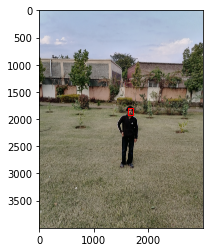

DETECTED FACES FROM THE IMG :  1


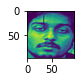

127.0.0.1 - - [26/Jul/2021 21:56:44] "POST / HTTP/1.1" 200 -


Predicted Labels:  [4]


127.0.0.1 - - [26/Jul/2021 21:56:44] "GET /static/face0.jpeg HTTP/1.1" 200 -
127.0.0.1 - - [26/Jul/2021 21:56:44] "GET /static/boxedImg.jpg HTTP/1.1" 200 -
127.0.0.1 - - [26/Jul/2021 21:56:45] "GET /favicon.ico HTTP/1.1" 200 -


pix :  favicon.ico


In [98]:
##running the flask app
app = Flask(__name__, template_folder='/content/template')
#,static_folder='/content/static'
#,static_folder='/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/htmlPages/static', template_folder='/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/htmlPages')
# /content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD

#UPLOAD_FOLDER='/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Files-TD/htmlPages/static'
#app.config['UPLOAD_FOLDER'] = UPLOAD_FOLDER

#1 content/
picsFolder=os.path.join('/content/static','pics')
#2
app.config['UPLOAD_FOLDER'] = picsFolder

run_with_ngrok(app) # making the ip public to get the url
@app.route("/", methods=['POST','GET'])
def index():
  if request.method == "POST":
    if 'img' not in request.files:
      return redirect(request.url)
    fn = request.files.get('img', '')
    if fn.filename == '':
      return redirect(request.url)
    #image = request.form["img"] # just gives name of image file.
    image = Image.open(fn)
    if( fn.filename[0] == 'r'):
      image = image.rotate(270)
    image.save("uploadedImg.jpg")
    imgpixels=asarray(image)
    detector = MTCNN()
    #faces = extract_face(imgpixels, detector,"none", "none","none", required_size=(96, 96))
    required_size=(96, 96)
    results = detector.detect_faces(imgpixels)
    # Drawing boxes for the faces detected & Display.
    pyplot.imshow(imgpixels)
    ax = pyplot.gca() # getting context for drawing the boxes.
    # plot each box on each face.
    for result in results:
      x, y, w, h = result['box'] # getting coordinates.
      # create the shape
      rect = Rectangle((x, y), w, h, fill=False, color='red')
      # draw the box
      ax.add_patch(rect)
    plt.savefig('/content/static/boxedImg.jpg')
    pyplot.show()
    '''
    xx = Image.open("boxedImg.jpg")
    xx.show()
    print( "boxedImg ", xx)
    '''
    faces=[]
    numFaces = len(results)
    for i in range(numFaces): # Save the locality of each face in list faces.
      x1, y1,w, h = results[i]['box'] # for all faces detected in the Pic.
      # bug fixing - incase values are in the -ive.
      x1, y1 = abs(x1), abs(y1)
      x2, y2 = x1 + w, y1 + h
      # extract the face
      face = imgpixels[y1:y2, x1:x2]

      # resize pixels to the model size.
      #print("image f1 size ",image.size) #(3000, 4000)
      image = Image.fromarray(face)
      #print("image f2 size ",image.size)
      image = ImageOps.grayscale(image) #Grayscale conversion.
      image = image.resize(required_size) # working on a single face.
      face_array = np.array(image)
      #face_array = asarray(image)
      #print(face_array.shape) #(96, 96, 3)
      faces.append(face_array) # save in list.

    lenface = len(faces)
    print("DETECTED FACES FROM THE IMG : " ,lenface )
    # Display faces detected!
    c=1
    saveFace=[]
    for i in range(lenface):
      pyplot.subplot(4, 6, c) # rows, cols.
      plt.imshow(faces[i])
      # save each face
      im = Image.fromarray( faces[i])
      saveFace.append(im.save("/content/static/face"+str(i)+".jpeg"))
      c+=1
    plt.show()
    facesArr =np.array(faces)
    facesArr = facesArr / 255.0
    facesArr = np.expand_dims(facesArr, axis=3)

    Feat1 = dcnn1.predict(facesArr) 
    Feat2 = dcnn2.predict(facesArr)
    facesFeats = np.concatenate([Feat1, Feat2], 3)#3
    # Predicted Labels 
    yhat_classes = cnn.predict_classes(facesFeats, verbose=0)
    print("Predicted Labels: ",yhat_classes)
    # convert to names
    personNames=[]
    for id in yhat_classes:
      if id == 8:
        personNames.append("Anas")
      elif id == 2:
        personNames.append("Laiba")
      elif id == 4:
        personNames.append("Abdur-Rafay")
      elif id == 7:
        personNames.append("Hassan")
      elif id == 6:
        personNames.append("Musaab")
      elif id == 5:
        personNames.append("Zaryab")
      elif id == 0:
        personNames.append("Huraira")
      elif id == 1:
        personNames.append("Ruhma")
      elif id == 3:
        personNames.append("Ibrahim")
      elif id == 9:
        personNames.append("Saad")
      elif id == 10:
        personNames.append("Munzar")

    send=[1,2,7]
    #send.append(boxedImg)
    #return render_template('TD.html', imgList=imgList) 
    #return redirect(url_for("detection", pix=send))
    return render_template('displayResults.html', value=lenface, labels=personNames)
  else:
    #pic1 = os.path.join(app.config['UPLOAD_FOLDER'],'logo.JPG')
    return render_template('index.html') #, user_image=pic1) 
@app.route("/<pix>")
def detection (pix):
  print("pix : ", pix)
  animal = 'cat'
  return render_template('displayResults.html', value=animal)
  #return ' <h1> yoyo </h1> <p> lol </p> <h2>HTML Image</h2>  <img src="/static/boxedImg.jpg" > '
  #return ' <html><body> <img src="{{url_for("static",filename = "/cnic2.jpeg")}}"> </body></html> '
  #return ' <h1> yoyo </h1>
@app.route("/test")
def test_page():
  return '<h1> Flask Test Page </h1>'
app.run()

**TESTING ON IMAGES** 

img type:  q10.jpg


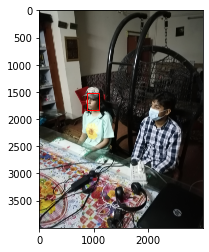

DETECTED FACES FROM THE IMG :  9


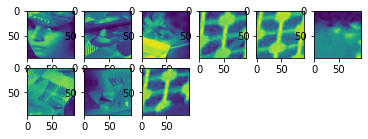

Predicted Labels:  [4 4 2 4 4 3 2 3 4]
img type:  q1.jpg


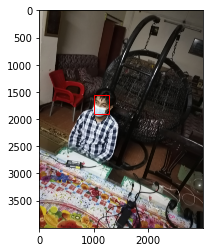

DETECTED FACES FROM THE IMG :  2


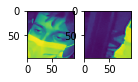

Predicted Labels:  [4 6]
img type:  q14.jpg


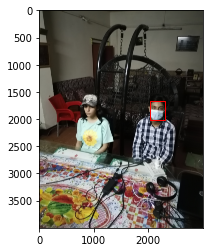

DETECTED FACES FROM THE IMG :  4


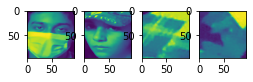

Predicted Labels:  [2 2 1 1]
img type:  q13.jpg


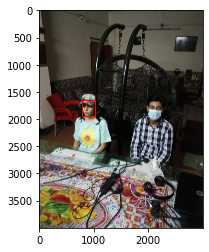

DETECTED FACES FROM THE IMG :  5


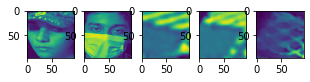

Predicted Labels:  [2 2 1 4 9]
img type:  q12.jpg


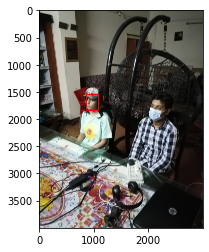

DETECTED FACES FROM THE IMG :  10


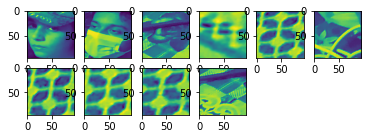

Predicted Labels:  [ 4  4  4  6  4  9  4 10  4  4]
img type:  q11.jpg


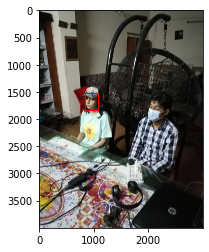

DETECTED FACES FROM THE IMG :  6


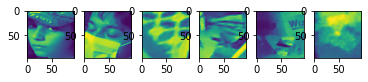

Predicted Labels:  [4 2 4 1 0 0]
img type:  q18.jpg


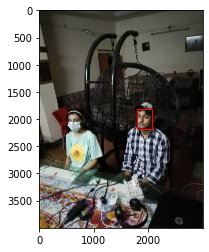

DETECTED FACES FROM THE IMG :  3


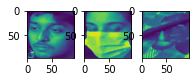

Predicted Labels:  [2 4 9]
img type:  q17.jpg


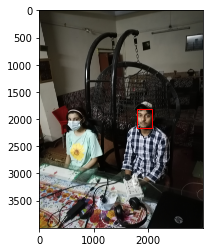

DETECTED FACES FROM THE IMG :  4


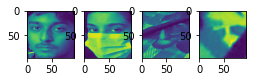

Predicted Labels:  [2 4 1 2]
img type:  q16.jpg


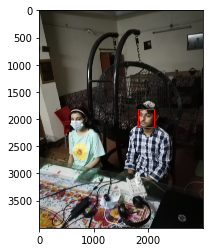

DETECTED FACES FROM THE IMG :  3


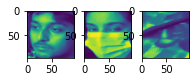

Predicted Labels:  [2 4 1]
img type:  q15.jpg


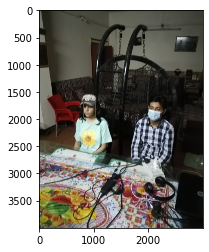

DETECTED FACES FROM THE IMG :  7


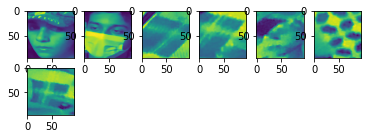

Predicted Labels:  [2 2 4 1 3 6 6]
img type:  q2.jpg


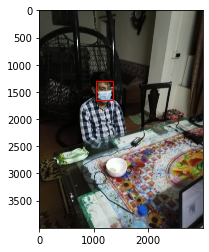

DETECTED FACES FROM THE IMG :  2


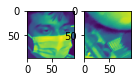

Predicted Labels:  [2 9]
img type:  q19.jpg


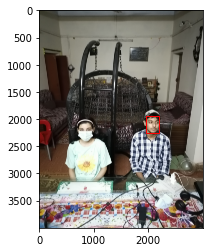

DETECTED FACES FROM THE IMG :  5


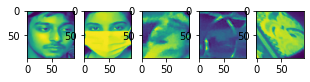

Predicted Labels:  [4 8 0 9 8]
img type:  q23.jpg


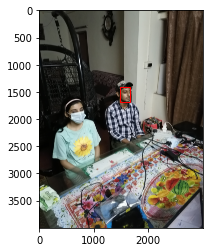

DETECTED FACES FROM THE IMG :  4


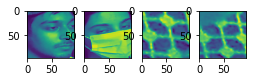

Predicted Labels:  [2 2 3 0]
img type:  q22.jpg


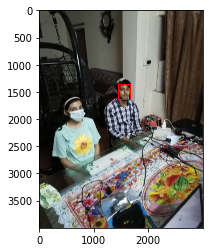

DETECTED FACES FROM THE IMG :  7


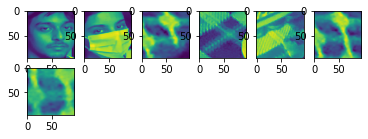

Predicted Labels:  [2 2 0 6 4 0 6]
img type:  q21.jpg


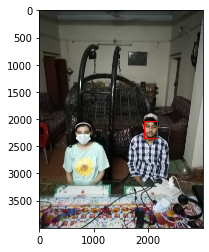

DETECTED FACES FROM THE IMG :  4


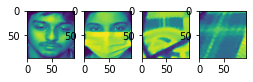

Predicted Labels:  [ 4  6 10  3]
img type:  q20.jpg


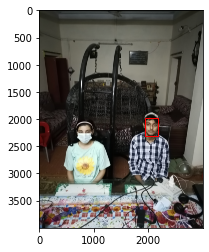

DETECTED FACES FROM THE IMG :  4


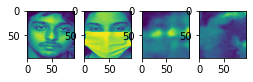

Predicted Labels:  [4 6 0 2]
img type:  q27.jpg


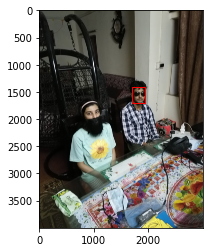

DETECTED FACES FROM THE IMG :  3


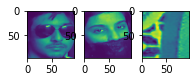

Predicted Labels:  [2 2 3]
img type:  q26.jpg


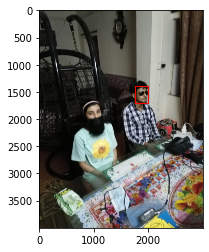

DETECTED FACES FROM THE IMG :  2


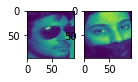

Predicted Labels:  [4 2]
img type:  q25.jpg


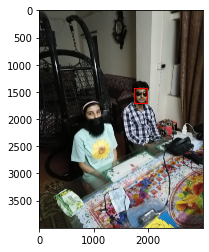

DETECTED FACES FROM THE IMG :  2


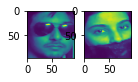

Predicted Labels:  [2 2]
img type:  q24.jpg


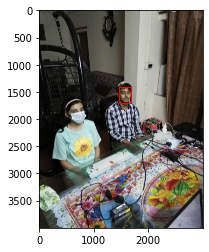

DETECTED FACES FROM THE IMG :  7


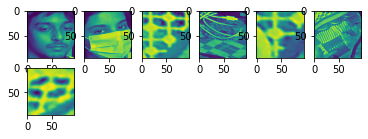

Predicted Labels:  [2 2 4 4 6 4 4]
img type:  q31.jpg


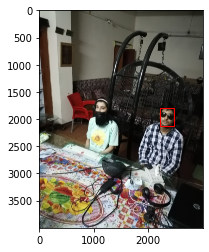

DETECTED FACES FROM THE IMG :  5


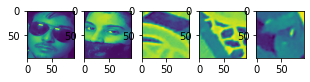

Predicted Labels:  [ 4  4  1 10  3]
img type:  q30.jpg


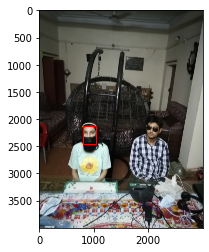

DETECTED FACES FROM THE IMG :  4


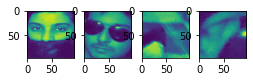

Predicted Labels:  [2 2 3 2]
img type:  q3.jpg


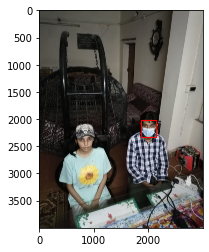

DETECTED FACES FROM THE IMG :  3


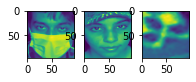

Predicted Labels:  [2 2 3]
img type:  q29.jpg


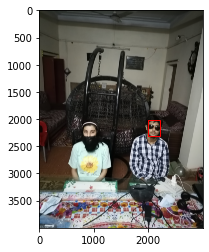

DETECTED FACES FROM THE IMG :  5


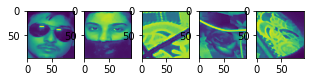

Predicted Labels:  [4 2 1 0 2]
img type:  q28.jpg


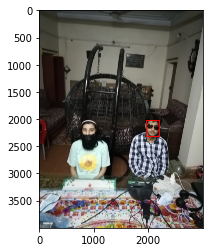

DETECTED FACES FROM THE IMG :  4


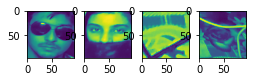

Predicted Labels:  [ 4  4 10  0]
img type:  q33.jpg


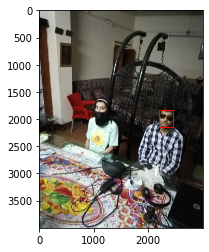

DETECTED FACES FROM THE IMG :  6


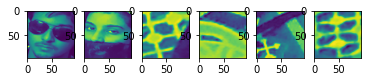

Predicted Labels:  [4 4 4 1 1 4]
img type:  q32.jpg


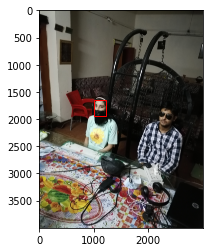

DETECTED FACES FROM THE IMG :  8


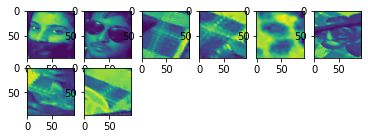

Predicted Labels:  [2 4 3 1 6 1 4 6]
img type:  q38.jpg


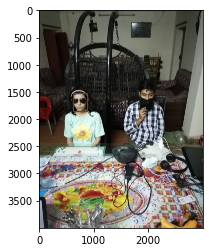

DETECTED FACES FROM THE IMG :  4


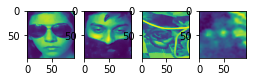

Predicted Labels:  [2 2 4 0]
img type:  q37.jpg


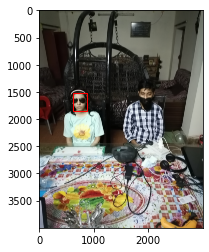

DETECTED FACES FROM THE IMG :  3


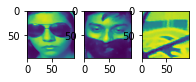

Predicted Labels:  [ 2  2 10]
img type:  q36.jpg


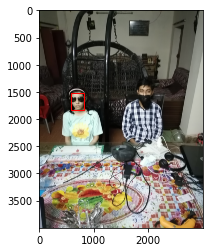

DETECTED FACES FROM THE IMG :  3


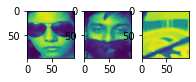

Predicted Labels:  [ 2  4 10]
img type:  q35.jpg


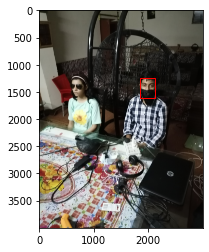

DETECTED FACES FROM THE IMG :  11


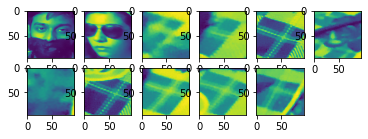

Predicted Labels:  [ 2  2  6  1  6  1  6 10  6  6  6]
img type:  q34.jpg


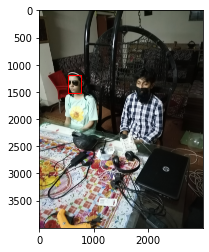

DETECTED FACES FROM THE IMG :  10


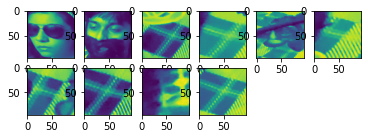

Predicted Labels:  [ 2  2 10  6  1  1  6  1  6  1]
img type:  q42.jpeg


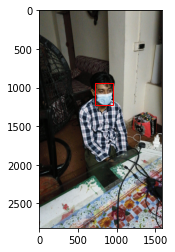

DETECTED FACES FROM THE IMG :  2


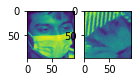

Predicted Labels:  [2 0]
img type:  q41.jpg


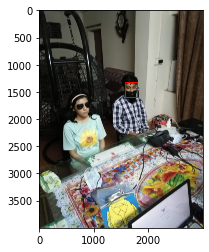

DETECTED FACES FROM THE IMG :  2


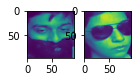

Predicted Labels:  [2 2]
img type:  q40.jpg


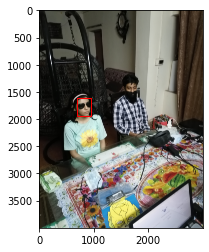

DETECTED FACES FROM THE IMG :  4


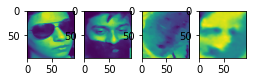

Predicted Labels:  [2 9 1 6]
img type:  q4.jpg


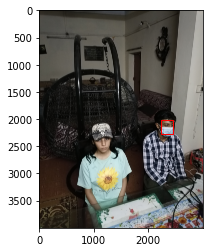

DETECTED FACES FROM THE IMG :  2


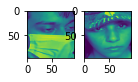

Predicted Labels:  [2 2]
img type:  q39.jpg


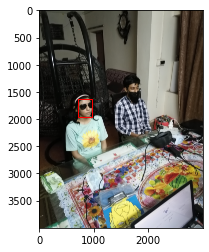

DETECTED FACES FROM THE IMG :  2


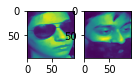

Predicted Labels:  [2 2]
img type:  q9.jpg


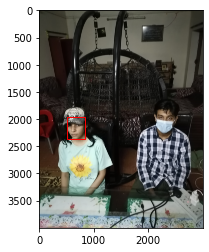

DETECTED FACES FROM THE IMG :  2


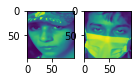

Predicted Labels:  [2 2]
img type:  q8.jpg


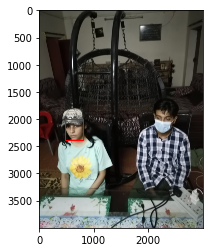

DETECTED FACES FROM THE IMG :  3


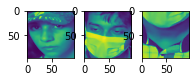

Predicted Labels:  [ 2  2 10]
img type:  q7.jpg


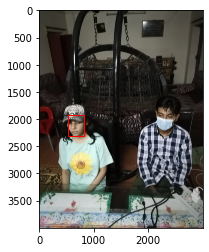

DETECTED FACES FROM THE IMG :  2


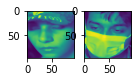

Predicted Labels:  [2 2]
img type:  q6.jpg


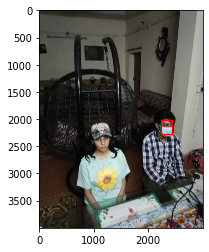

DETECTED FACES FROM THE IMG :  2


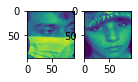

Predicted Labels:  [2 2]
img type:  q5.jpg


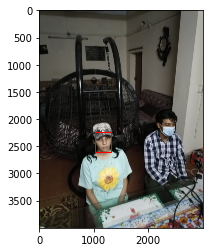

DETECTED FACES FROM THE IMG :  3


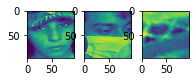

Predicted Labels:  [2 2 3]


In [45]:
sub_dir="/content/gdrive/MyDrive/Laiba fyp test photos/" # just any folder with pics
for filename in listdir(sub_dir):
  print("img type: ", filename)
  imagePath = sub_dir + filename
  image = Image.open(imagePath)
  if( filename[0] == 'r'):
    image = image.rotate(270)
  imgpixels=asarray(image)
  detector = MTCNN()
  #faces = extract_face(imgpixels, detector,"none", "none","none", required_size=(96, 96))
  required_size=(96, 96)
  results = detector.detect_faces(imgpixels)
  # Drawing boxes for the faces detected & Display.
  pyplot.imshow(imgpixels)
  ax = pyplot.gca() # getting context for drawing the boxes.
  # plot each box on each face.
  for result in results:
    x, y, w, h = result['box'] # getting coordinates.
    # create the shape
    rect = Rectangle((x, y), w, h, fill=False, color='red')
    # draw the box
    ax.add_patch(rect)
    pyplot.show()
  faces=[]
  numFaces = len(results)
  for i in range(numFaces):
    x1, y1,w, h = results[i]['box'] # for all faces detected in the Pic.
    # bug fixing - incase values are in the -ive.
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + w, y1 + h
    # extract the face
    face = imgpixels[y1:y2, x1:x2]
    # resize pixels to the model size.
    #print("image f1 size ",image.size) #(3000, 4000)
    image = Image.fromarray(face)
    #print("image f2 size ",image.size)
    image = ImageOps.grayscale(image) #Grayscale conversion.
    image = image.resize(required_size) # working on a single face.
    face_array = np.array(image)
    #face_array = asarray(image)
    #print(face_array.shape) #(96, 96, 3)
    faces.append(face_array) # save in list.

  lenface = len(faces)
  print("DETECTED FACES FROM THE IMG : " ,lenface )
  # Display faces detected!
  c=1
  saveFace=[]
  for i in range(lenface):
    pyplot.subplot(4, 6, c) # rows, cols.
    plt.imshow(faces[i])
    # save each face
    im = Image.fromarray( faces[i])
    c+=1
  plt.show()
  facesArr =np.array(faces)
  facesArr = facesArr / 255.0
  facesArr = np.expand_dims(facesArr, axis=3)

  Feat1 = dcnn1.predict(facesArr) 
  Feat2 = dcnn2.predict(facesArr)
  facesFeats = np.concatenate([Feat1, Feat2], 3)#3
  # Predicted Labels 
  yhat_classes = cnn.predict_classes(facesFeats, verbose=0)
  print("Predicted Labels: ",yhat_classes)

**TESTING ON VIDEOS** 

Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


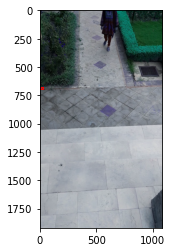

DETECTED FACES FROM THE IMG :  1


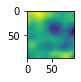

Predicted Labels:  [3]
Read a new frame:  True
Read a new frame:  True


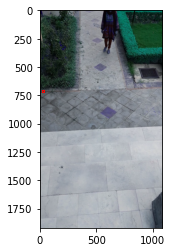

DETECTED FACES FROM THE IMG :  1


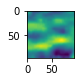

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


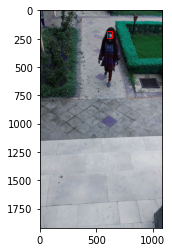

DETECTED FACES FROM THE IMG :  1


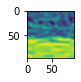

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


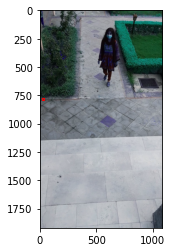

DETECTED FACES FROM THE IMG :  1


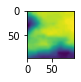

Predicted Labels:  [6]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


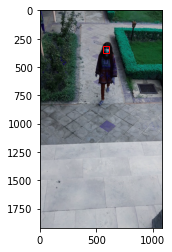

DETECTED FACES FROM THE IMG :  1


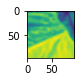

Predicted Labels:  [6]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


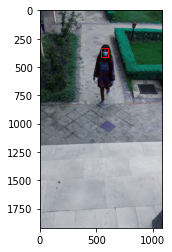

DETECTED FACES FROM THE IMG :  1


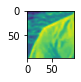

Predicted Labels:  [6]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


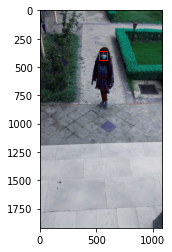

DETECTED FACES FROM THE IMG :  1


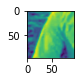

Predicted Labels:  [6]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:

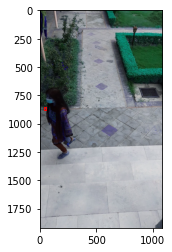

DETECTED FACES FROM THE IMG :  1


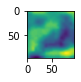

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


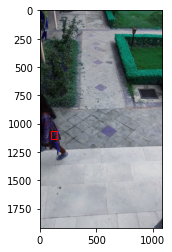

DETECTED FACES FROM THE IMG :  1


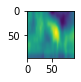

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


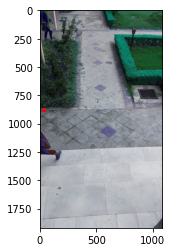

DETECTED FACES FROM THE IMG :  1


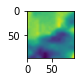

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


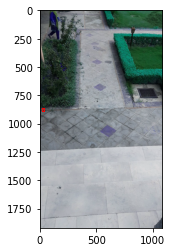

DETECTED FACES FROM THE IMG :  1


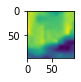

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:

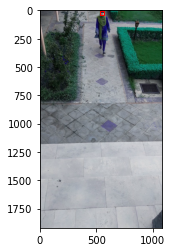

DETECTED FACES FROM THE IMG :  1


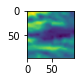

Predicted Labels:  [2]
Read a new frame:  True
Read a new frame:  True


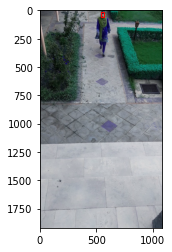

DETECTED FACES FROM THE IMG :  1


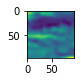

Predicted Labels:  [3]
Read a new frame:  True


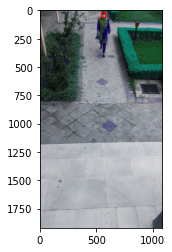

DETECTED FACES FROM THE IMG :  1


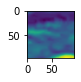

Predicted Labels:  [3]
Read a new frame:  True


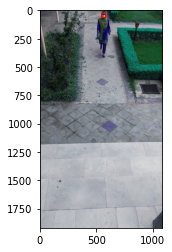

DETECTED FACES FROM THE IMG :  1


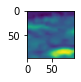

Predicted Labels:  [3]
Read a new frame:  True


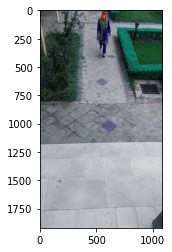

DETECTED FACES FROM THE IMG :  1


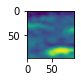

Predicted Labels:  [0]
Read a new frame:  True


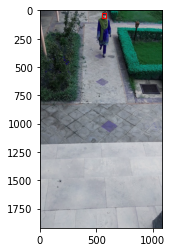

DETECTED FACES FROM THE IMG :  1


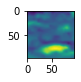

Predicted Labels:  [0]
Read a new frame:  True


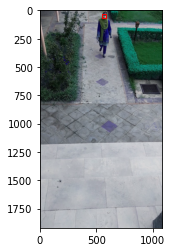

DETECTED FACES FROM THE IMG :  1


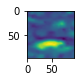

Predicted Labels:  [0]
Read a new frame:  True


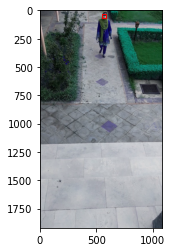

DETECTED FACES FROM THE IMG :  1


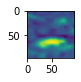

Predicted Labels:  [0]
Read a new frame:  True


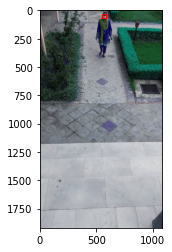

DETECTED FACES FROM THE IMG :  1


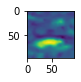

Predicted Labels:  [0]
Read a new frame:  True


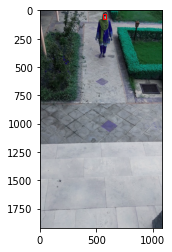

DETECTED FACES FROM THE IMG :  1


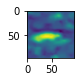

Predicted Labels:  [3]
Read a new frame:  True


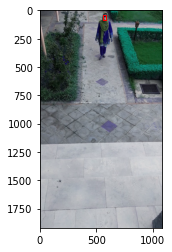

DETECTED FACES FROM THE IMG :  1


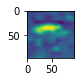

Predicted Labels:  [3]
Read a new frame:  True


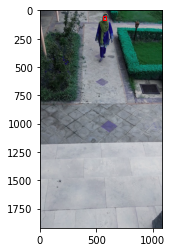

DETECTED FACES FROM THE IMG :  1


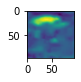

Predicted Labels:  [3]
Read a new frame:  True


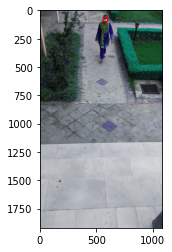

DETECTED FACES FROM THE IMG :  1


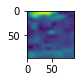

Predicted Labels:  [3]
Read a new frame:  True


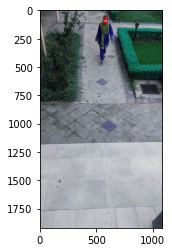

DETECTED FACES FROM THE IMG :  1


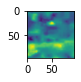

Predicted Labels:  [3]
Read a new frame:  True


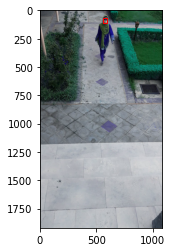

DETECTED FACES FROM THE IMG :  1


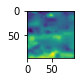

Predicted Labels:  [0]
Read a new frame:  True


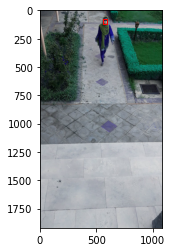

DETECTED FACES FROM THE IMG :  1


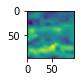

Predicted Labels:  [0]
Read a new frame:  True


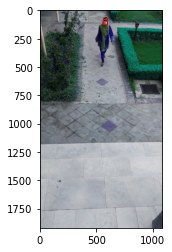

DETECTED FACES FROM THE IMG :  1


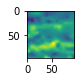

Predicted Labels:  [0]
Read a new frame:  True


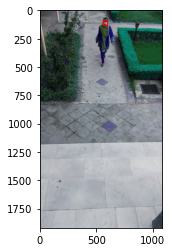

DETECTED FACES FROM THE IMG :  1


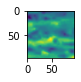

Predicted Labels:  [0]
Read a new frame:  True


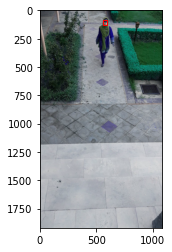

DETECTED FACES FROM THE IMG :  1


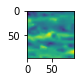

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


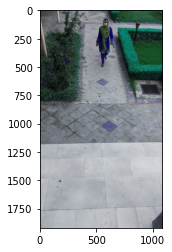

DETECTED FACES FROM THE IMG :  1


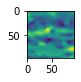

Predicted Labels:  [0]
Read a new frame:  True


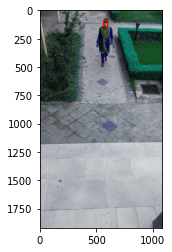

DETECTED FACES FROM THE IMG :  1


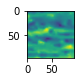

Predicted Labels:  [0]
Read a new frame:  True


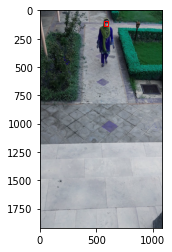

DETECTED FACES FROM THE IMG :  1


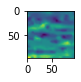

Predicted Labels:  [0]
Read a new frame:  True


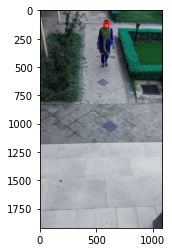

DETECTED FACES FROM THE IMG :  1


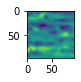

Predicted Labels:  [0]
Read a new frame:  True


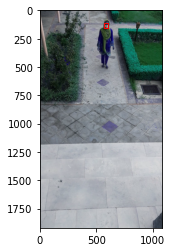

DETECTED FACES FROM THE IMG :  1


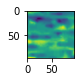

Predicted Labels:  [0]
Read a new frame:  True


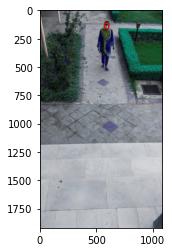

DETECTED FACES FROM THE IMG :  1


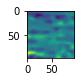

Predicted Labels:  [0]
Read a new frame:  True


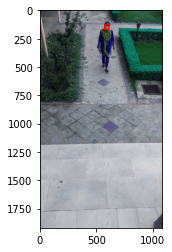

DETECTED FACES FROM THE IMG :  1


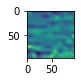

Predicted Labels:  [0]
Read a new frame:  True


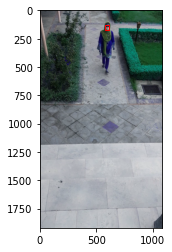

DETECTED FACES FROM THE IMG :  1


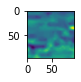

Predicted Labels:  [0]
Read a new frame:  True


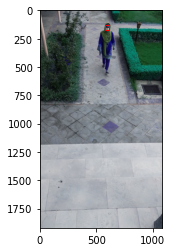

DETECTED FACES FROM THE IMG :  1


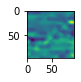

Predicted Labels:  [0]
Read a new frame:  True


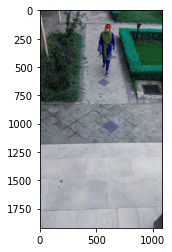

DETECTED FACES FROM THE IMG :  1


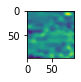

Predicted Labels:  [0]
Read a new frame:  True


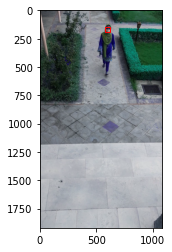

DETECTED FACES FROM THE IMG :  1


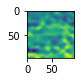

Predicted Labels:  [0]
Read a new frame:  True


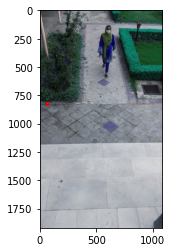

DETECTED FACES FROM THE IMG :  2


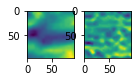

Predicted Labels:  [0 0]
Read a new frame:  True
Read a new frame:  True


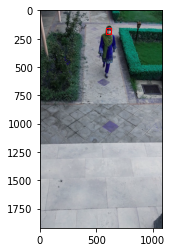

DETECTED FACES FROM THE IMG :  1


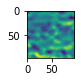

Predicted Labels:  [0]
Read a new frame:  True


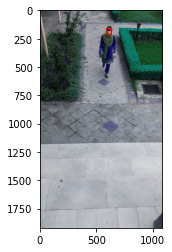

DETECTED FACES FROM THE IMG :  1


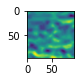

Predicted Labels:  [0]
Read a new frame:  True


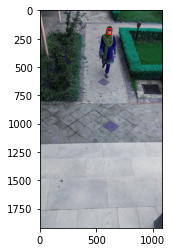

DETECTED FACES FROM THE IMG :  1


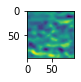

Predicted Labels:  [0]
Read a new frame:  True


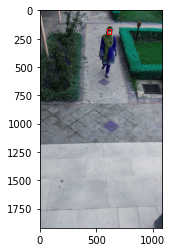

DETECTED FACES FROM THE IMG :  1


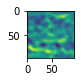

Predicted Labels:  [0]
Read a new frame:  True


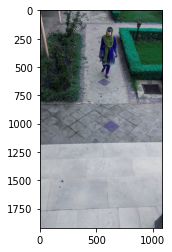

DETECTED FACES FROM THE IMG :  2


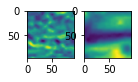

Predicted Labels:  [0 0]
Read a new frame:  True


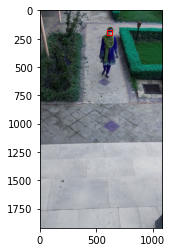

DETECTED FACES FROM THE IMG :  1


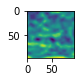

Predicted Labels:  [0]
Read a new frame:  True


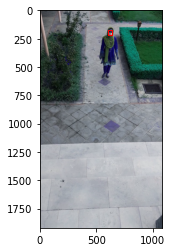

DETECTED FACES FROM THE IMG :  1


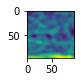

Predicted Labels:  [0]
Read a new frame:  True


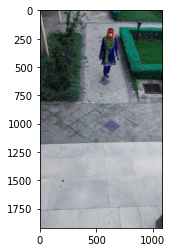

DETECTED FACES FROM THE IMG :  1


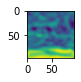

Predicted Labels:  [0]
Read a new frame:  True


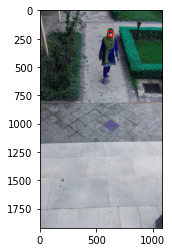

DETECTED FACES FROM THE IMG :  1


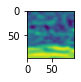

Predicted Labels:  [0]
Read a new frame:  True


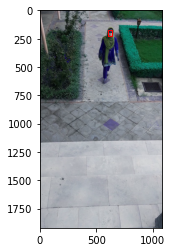

DETECTED FACES FROM THE IMG :  1


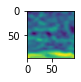

Predicted Labels:  [0]
Read a new frame:  True


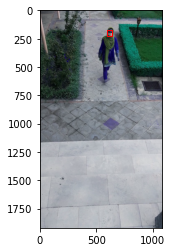

DETECTED FACES FROM THE IMG :  1


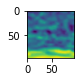

Predicted Labels:  [0]
Read a new frame:  True


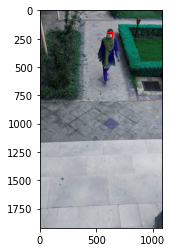

DETECTED FACES FROM THE IMG :  1


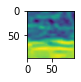

Predicted Labels:  [0]
Read a new frame:  True


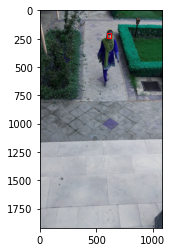

DETECTED FACES FROM THE IMG :  1


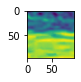

Predicted Labels:  [0]
Read a new frame:  True


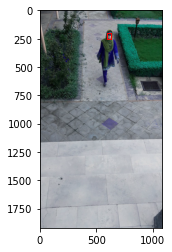

DETECTED FACES FROM THE IMG :  1


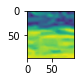

Predicted Labels:  [8]
Read a new frame:  True


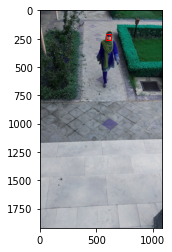

DETECTED FACES FROM THE IMG :  1


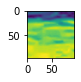

Predicted Labels:  [8]
Read a new frame:  True


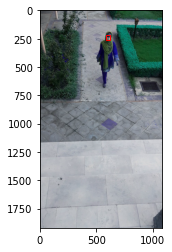

DETECTED FACES FROM THE IMG :  1


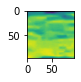

Predicted Labels:  [8]
Read a new frame:  True


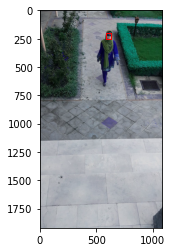

DETECTED FACES FROM THE IMG :  1


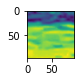

Predicted Labels:  [8]
Read a new frame:  True


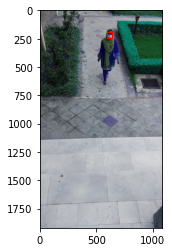

DETECTED FACES FROM THE IMG :  1


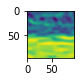

Predicted Labels:  [0]
Read a new frame:  True


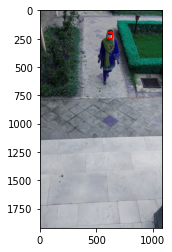

DETECTED FACES FROM THE IMG :  1


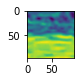

Predicted Labels:  [0]
Read a new frame:  True


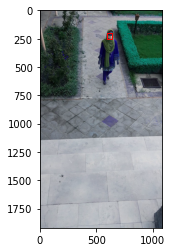

DETECTED FACES FROM THE IMG :  1


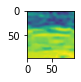

Predicted Labels:  [8]
Read a new frame:  True


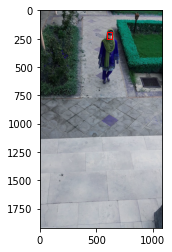

DETECTED FACES FROM THE IMG :  1


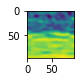

Predicted Labels:  [0]
Read a new frame:  True


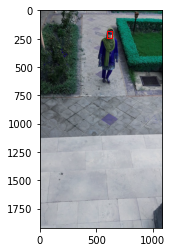

DETECTED FACES FROM THE IMG :  1


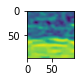

Predicted Labels:  [0]
Read a new frame:  True


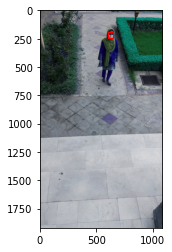

DETECTED FACES FROM THE IMG :  1


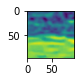

Predicted Labels:  [0]
Read a new frame:  True


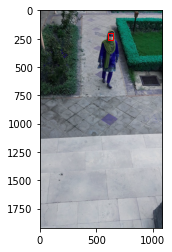

DETECTED FACES FROM THE IMG :  1


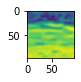

Predicted Labels:  [8]
Read a new frame:  True


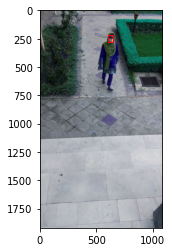

DETECTED FACES FROM THE IMG :  1


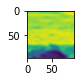

Predicted Labels:  [8]
Read a new frame:  True


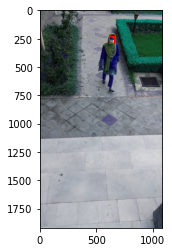

DETECTED FACES FROM THE IMG :  1


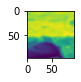

Predicted Labels:  [6]
Read a new frame:  True


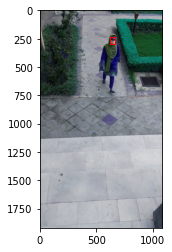

DETECTED FACES FROM THE IMG :  1


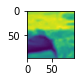

Predicted Labels:  [6]
Read a new frame:  True


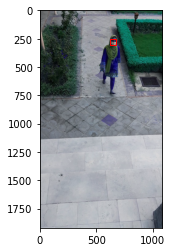

DETECTED FACES FROM THE IMG :  1


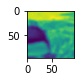

Predicted Labels:  [6]
Read a new frame:  True


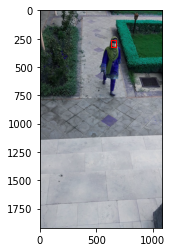

DETECTED FACES FROM THE IMG :  1


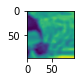

Predicted Labels:  [1]
Read a new frame:  True


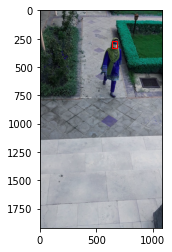

DETECTED FACES FROM THE IMG :  1


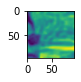

Predicted Labels:  [0]
Read a new frame:  True


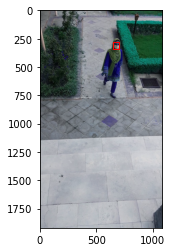

DETECTED FACES FROM THE IMG :  1


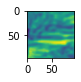

Predicted Labels:  [0]
Read a new frame:  True


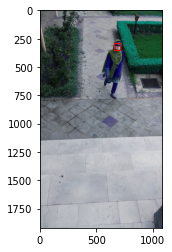

DETECTED FACES FROM THE IMG :  1


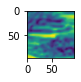

Predicted Labels:  [1]
Read a new frame:  True


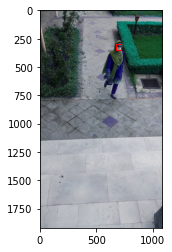

DETECTED FACES FROM THE IMG :  1


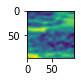

Predicted Labels:  [1]
Read a new frame:  True


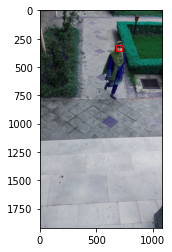

DETECTED FACES FROM THE IMG :  1


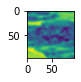

Predicted Labels:  [4]
Read a new frame:  True


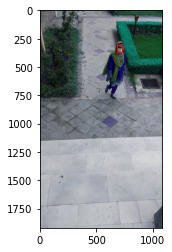

DETECTED FACES FROM THE IMG :  1


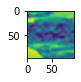

Predicted Labels:  [0]
Read a new frame:  True


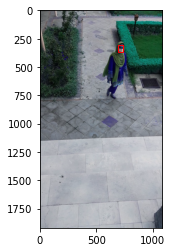

DETECTED FACES FROM THE IMG :  1


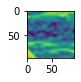

Predicted Labels:  [1]
Read a new frame:  True


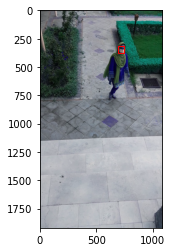

DETECTED FACES FROM THE IMG :  1


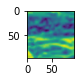

Predicted Labels:  [1]
Read a new frame:  True


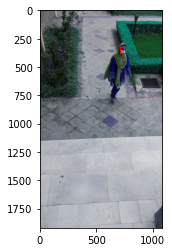

DETECTED FACES FROM THE IMG :  1


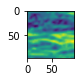

Predicted Labels:  [1]
Read a new frame:  True


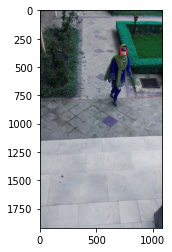

DETECTED FACES FROM THE IMG :  1


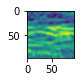

Predicted Labels:  [0]
Read a new frame:  True


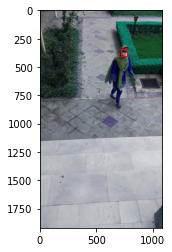

DETECTED FACES FROM THE IMG :  1


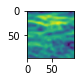

Predicted Labels:  [6]
Read a new frame:  True


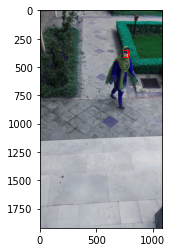

DETECTED FACES FROM THE IMG :  1


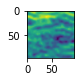

Predicted Labels:  [6]
Read a new frame:  True


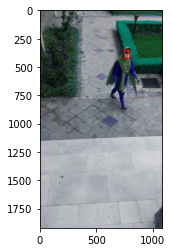

DETECTED FACES FROM THE IMG :  2


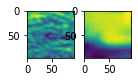

Predicted Labels:  [6 6]
Read a new frame:  True


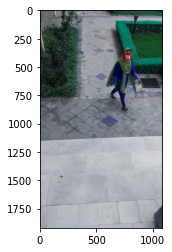

DETECTED FACES FROM THE IMG :  1


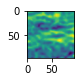

Predicted Labels:  [0]
Read a new frame:  True


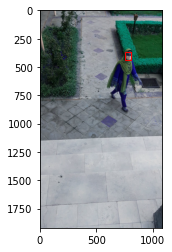

DETECTED FACES FROM THE IMG :  1


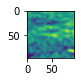

Predicted Labels:  [0]
Read a new frame:  True


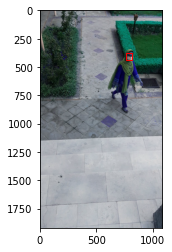

DETECTED FACES FROM THE IMG :  1


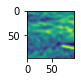

Predicted Labels:  [3]
Read a new frame:  True


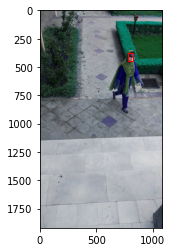

DETECTED FACES FROM THE IMG :  1


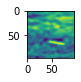

Predicted Labels:  [0]
Read a new frame:  True


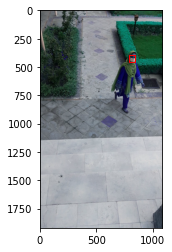

DETECTED FACES FROM THE IMG :  1


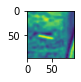

Predicted Labels:  [3]
Read a new frame:  True


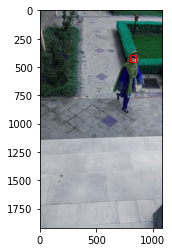

DETECTED FACES FROM THE IMG :  1


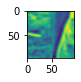

Predicted Labels:  [1]
Read a new frame:  True


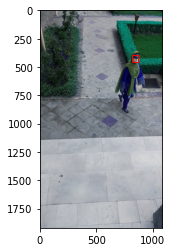

DETECTED FACES FROM THE IMG :  1


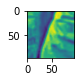

Predicted Labels:  [1]
Read a new frame:  True


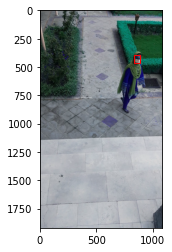

DETECTED FACES FROM THE IMG :  1


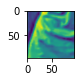

Predicted Labels:  [0]
Read a new frame:  True


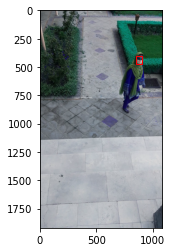

DETECTED FACES FROM THE IMG :  1


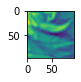

Predicted Labels:  [3]
Read a new frame:  True


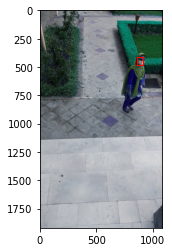

DETECTED FACES FROM THE IMG :  1


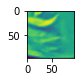

Predicted Labels:  [0]
Read a new frame:  True


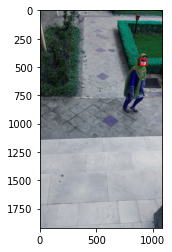

DETECTED FACES FROM THE IMG :  1


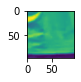

Predicted Labels:  [0]
Read a new frame:  True


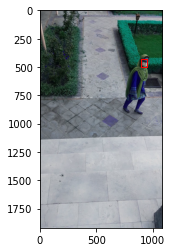

DETECTED FACES FROM THE IMG :  1


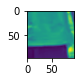

Predicted Labels:  [0]
Read a new frame:  True


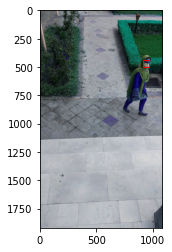

DETECTED FACES FROM THE IMG :  1


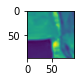

Predicted Labels:  [3]
Read a new frame:  True
Read a new frame:  True


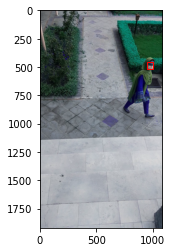

DETECTED FACES FROM THE IMG :  1


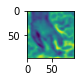

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


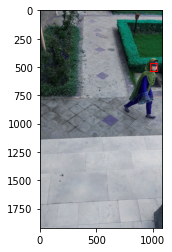

DETECTED FACES FROM THE IMG :  1


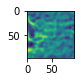

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


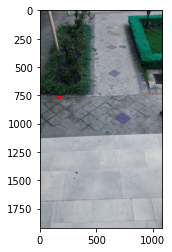

DETECTED FACES FROM THE IMG :  1


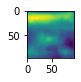

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


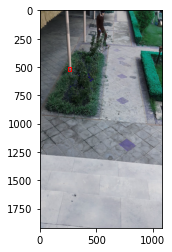

DETECTED FACES FROM THE IMG :  1


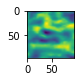

Predicted Labels:  [0]
Read a new frame:  True


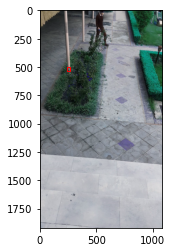

DETECTED FACES FROM THE IMG :  2


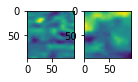

Predicted Labels:  [0 0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


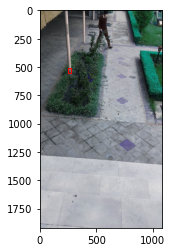

DETECTED FACES FROM THE IMG :  1


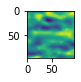

Predicted Labels:  [0]
Read a new frame:  True


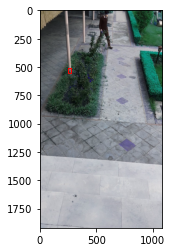

DETECTED FACES FROM THE IMG :  2


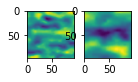

Predicted Labels:  [0 0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


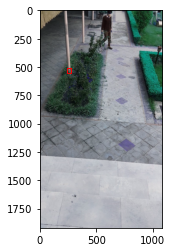

DETECTED FACES FROM THE IMG :  2


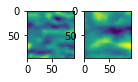

Predicted Labels:  [0 0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


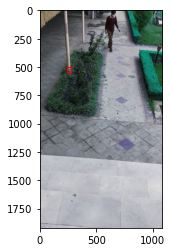

DETECTED FACES FROM THE IMG :  1


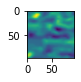

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


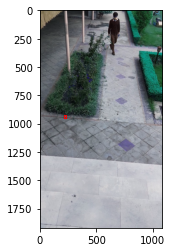

DETECTED FACES FROM THE IMG :  1


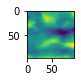

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


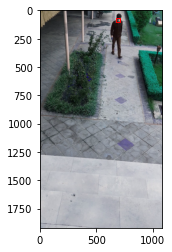

DETECTED FACES FROM THE IMG :  1


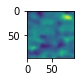

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


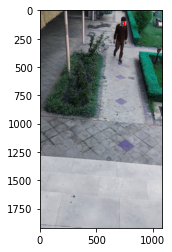

DETECTED FACES FROM THE IMG :  1


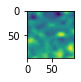

Predicted Labels:  [0]
Read a new frame:  True


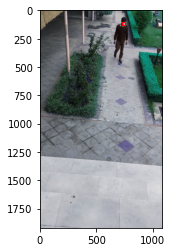

DETECTED FACES FROM THE IMG :  1


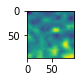

Predicted Labels:  [0]
Read a new frame:  True


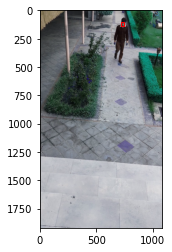

DETECTED FACES FROM THE IMG :  1


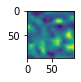

Predicted Labels:  [0]
Read a new frame:  True


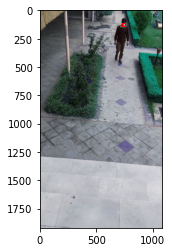

DETECTED FACES FROM THE IMG :  1


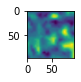

Predicted Labels:  [0]
Read a new frame:  True


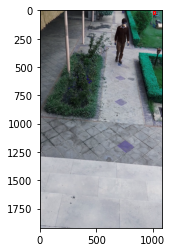

DETECTED FACES FROM THE IMG :  1


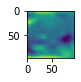

Predicted Labels:  [3]
Read a new frame:  True
Read a new frame:  True


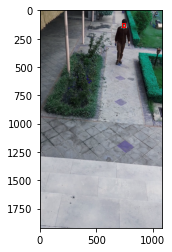

DETECTED FACES FROM THE IMG :  2


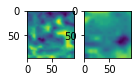

Predicted Labels:  [0 3]
Read a new frame:  True


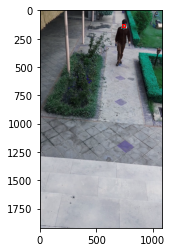

DETECTED FACES FROM THE IMG :  1


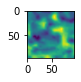

Predicted Labels:  [0]
Read a new frame:  True


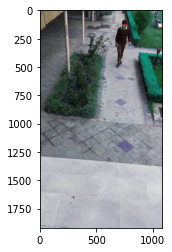

DETECTED FACES FROM THE IMG :  1


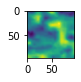

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


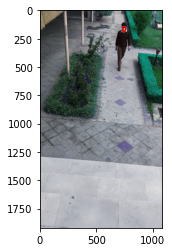

DETECTED FACES FROM THE IMG :  1


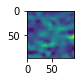

Predicted Labels:  [0]
Read a new frame:  True


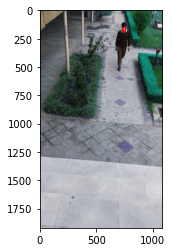

DETECTED FACES FROM THE IMG :  1


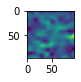

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


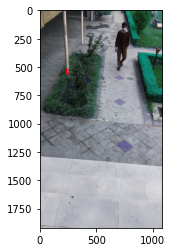

DETECTED FACES FROM THE IMG :  1


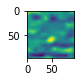

Predicted Labels:  [0]
Read a new frame:  True


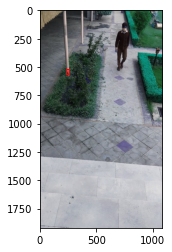

DETECTED FACES FROM THE IMG :  1


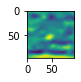

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


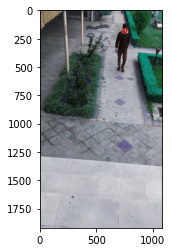

DETECTED FACES FROM THE IMG :  1


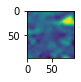

Predicted Labels:  [0]
Read a new frame:  True


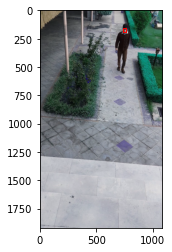

DETECTED FACES FROM THE IMG :  1


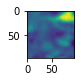

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


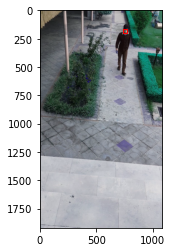

DETECTED FACES FROM THE IMG :  2


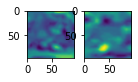

Predicted Labels:  [0 0]
Read a new frame:  True


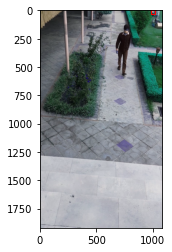

DETECTED FACES FROM THE IMG :  1


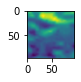

Predicted Labels:  [3]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


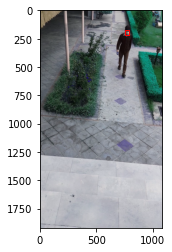

DETECTED FACES FROM THE IMG :  1


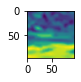

Predicted Labels:  [0]
Read a new frame:  True


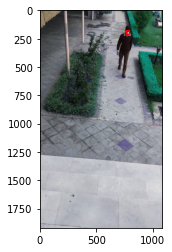

DETECTED FACES FROM THE IMG :  1


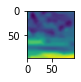

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


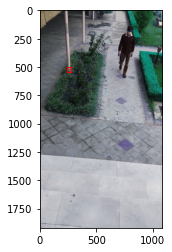

DETECTED FACES FROM THE IMG :  1


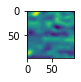

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


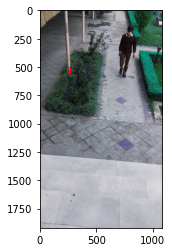

DETECTED FACES FROM THE IMG :  1


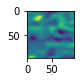

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


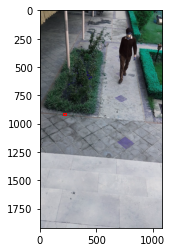

DETECTED FACES FROM THE IMG :  2


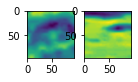

Predicted Labels:  [0 8]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


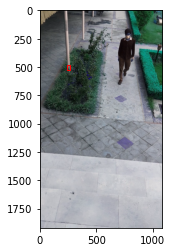

DETECTED FACES FROM THE IMG :  1


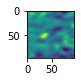

Predicted Labels:  [0]
Read a new frame:  True


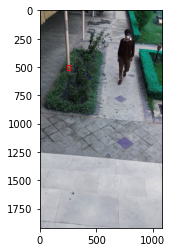

DETECTED FACES FROM THE IMG :  1


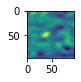

Predicted Labels:  [0]
Read a new frame:  True


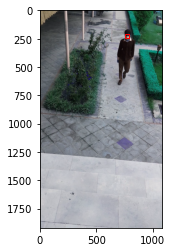

DETECTED FACES FROM THE IMG :  2


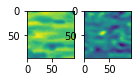

Predicted Labels:  [8 0]
Read a new frame:  True


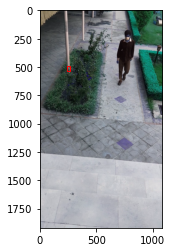

DETECTED FACES FROM THE IMG :  1


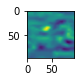

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


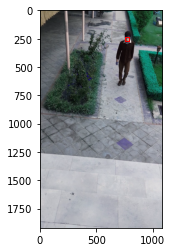

DETECTED FACES FROM THE IMG :  2


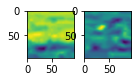

Predicted Labels:  [6 0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


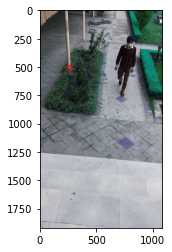

DETECTED FACES FROM THE IMG :  1


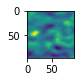

Predicted Labels:  [0]
Read a new frame:  True


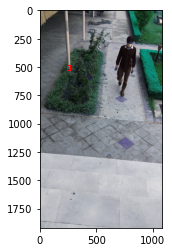

DETECTED FACES FROM THE IMG :  1


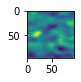

Predicted Labels:  [0]
Read a new frame:  True


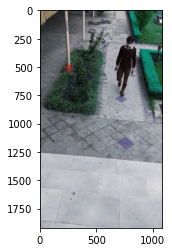

DETECTED FACES FROM THE IMG :  1


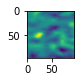

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


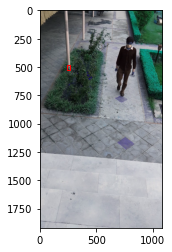

DETECTED FACES FROM THE IMG :  1


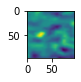

Predicted Labels:  [0]
Read a new frame:  True


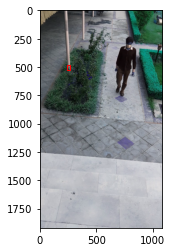

DETECTED FACES FROM THE IMG :  1


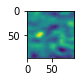

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


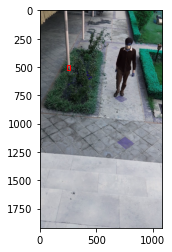

DETECTED FACES FROM THE IMG :  1


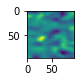

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


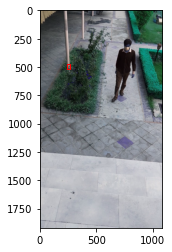

DETECTED FACES FROM THE IMG :  1


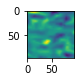

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


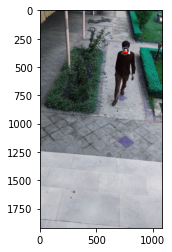

DETECTED FACES FROM THE IMG :  1


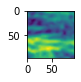

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


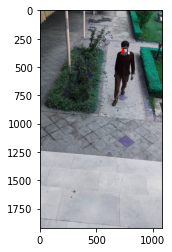

DETECTED FACES FROM THE IMG :  1


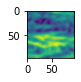

Predicted Labels:  [0]
Read a new frame:  True


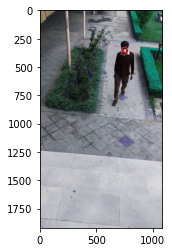

DETECTED FACES FROM THE IMG :  1


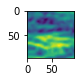

Predicted Labels:  [0]
Read a new frame:  True


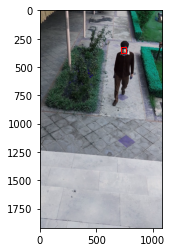

DETECTED FACES FROM THE IMG :  1


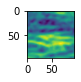

Predicted Labels:  [0]
Read a new frame:  True


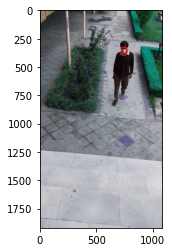

DETECTED FACES FROM THE IMG :  1


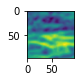

Predicted Labels:  [0]
Read a new frame:  True


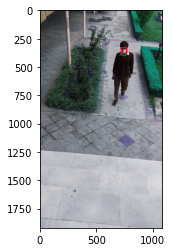

DETECTED FACES FROM THE IMG :  1


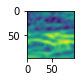

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


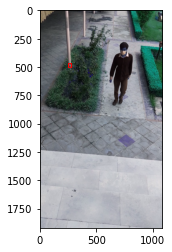

DETECTED FACES FROM THE IMG :  2


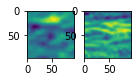

Predicted Labels:  [0 6]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


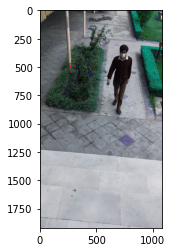

DETECTED FACES FROM THE IMG :  1


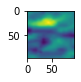

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


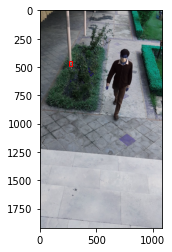

DETECTED FACES FROM THE IMG :  1


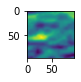

Predicted Labels:  [0]
Read a new frame:  True


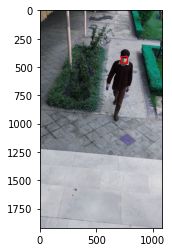

DETECTED FACES FROM THE IMG :  1


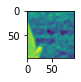

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


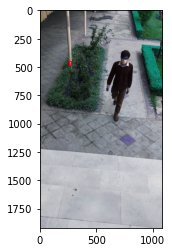

DETECTED FACES FROM THE IMG :  1


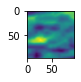

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


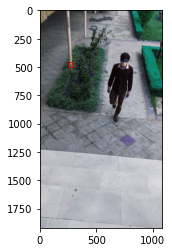

DETECTED FACES FROM THE IMG :  1


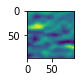

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


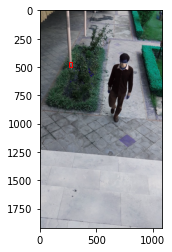

DETECTED FACES FROM THE IMG :  1


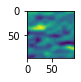

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


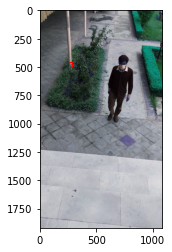

DETECTED FACES FROM THE IMG :  1


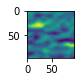

Predicted Labels:  [0]
Read a new frame:  True


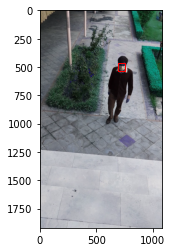

DETECTED FACES FROM THE IMG :  1


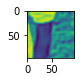

Predicted Labels:  [0]
Read a new frame:  True


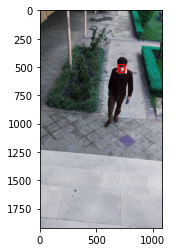

DETECTED FACES FROM THE IMG :  1


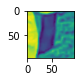

Predicted Labels:  [3]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


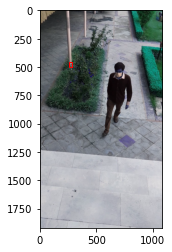

DETECTED FACES FROM THE IMG :  1


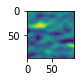

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


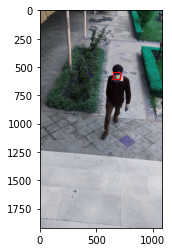

DETECTED FACES FROM THE IMG :  2


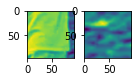

Predicted Labels:  [8 0]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


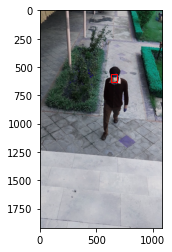

DETECTED FACES FROM THE IMG :  1


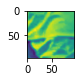

Predicted Labels:  [6]
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True
Read a new frame:  True


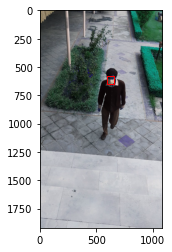

DETECTED FACES FROM THE IMG :  2


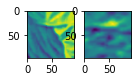

Predicted Labels:  [6 0]
Read a new frame:  True


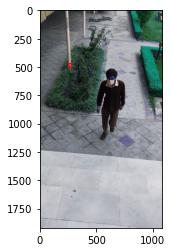

DETECTED FACES FROM THE IMG :  1


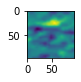

Predicted Labels:  [0]
Read a new frame:  True
Read a new frame:  True


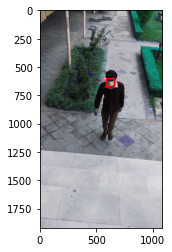

DETECTED FACES FROM THE IMG :  1


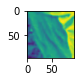

Predicted Labels:  [1]
Read a new frame:  True
Read a new frame:  True


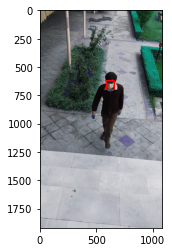

DETECTED FACES FROM THE IMG :  1


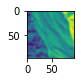

Predicted Labels:  [1]
Read a new frame:  True


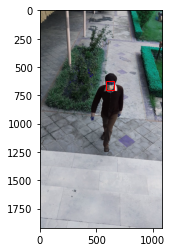

DETECTED FACES FROM THE IMG :  1


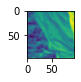

Predicted Labels:  [1]
Read a new frame:  True


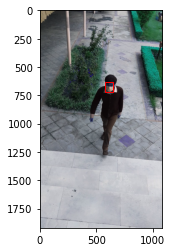

DETECTED FACES FROM THE IMG :  1


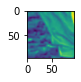

Predicted Labels:  [1]
Read a new frame:  True


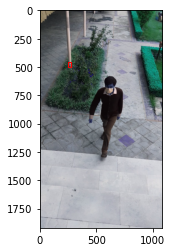

DETECTED FACES FROM THE IMG :  1


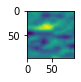

Predicted Labels:  [0]
Read a new frame:  True


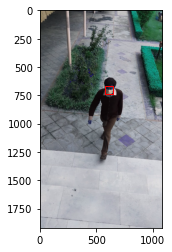

DETECTED FACES FROM THE IMG :  1


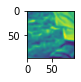

Predicted Labels:  [0]
Read a new frame:  True


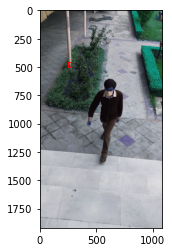

DETECTED FACES FROM THE IMG :  2


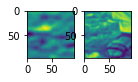

Predicted Labels:  [0 0]
Read a new frame:  True


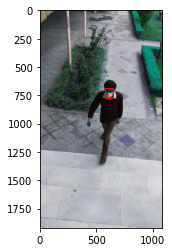

ValueError: ignored

In [82]:
import cv2
#/content/gdrive/MyDrive/FYP (2020-2021)/DataSets/Disjoint-Test-data/Videos-20210417T145450Z-001/Videos/video2.mp4'
#/content/gdrive/MyDrive/vods/1.mp4
vidcap = cv2.VideoCapture('/content/gdrive/MyDrive/vods/20210726_152017.mp4')
success,image = vidcap.read()
count = 0
detector = MTCNN()
while success:
  #cv2.imwrite("frame%d.jpg" % count, image)     # save frame as JPEG file      
  success,image = vidcap.read()
  print('Read a new frame: ', success)
  count += 1
  
  #image = Image.open(image)
  #if( filename[0] == 'r'):
    #image = image.rotate(270)
  #image = cv2.flip(image, flipCode = 0)
  image=cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
  #imgpixels=asarray(image)
  
  #faces = extract_face(imgpixels, detector,"none", "none","none", required_size=(96, 96))
  required_size=(96, 96)
  results = detector.detect_faces(image)
  #print("ressssssssssssssssssssssss: ", results)
  if( len(results)):
    # Drawing boxes for the faces detected & Display.
    pyplot.imshow(image)
    ax = pyplot.gca() # getting context for drawing the boxes.
    # plot each box on each face.
    for result in results:
      x, y, w, h = result['box'] # getting coordinates.
      # create the shape
      rect = Rectangle((x, y), w, h, fill=False, color='red')
      # draw the box
      ax.add_patch(rect)
      pyplot.show()
    faces=[]
    numFaces = len(results)
    for i in range(numFaces):
      x1, y1,w, h = results[i]['box'] # for all faces detected in the Pic.
      # bug fixing - incase values are in the -ive.
      x1, y1 = abs(x1), abs(y1)
      x2, y2 = x1 + w, y1 + h
      # extract the face
      face = imgpixels[y1:y2, x1:x2]
      # resize pixels to the model size.
      #print("image f1 size ",image.size) #(3000, 4000)
      image = Image.fromarray(face)
      #print("image f2 size ",image.size)
      image = ImageOps.grayscale(image) #Grayscale conversion.
      image = image.resize(required_size) # working on a single face.
      face_array = np.array(image)
      #face_array = asarray(image)
      #print(face_array.shape) #(96, 96, 3)
      faces.append(face_array) # save in list.

    lenface = len(faces)
    print("DETECTED FACES FROM THE IMG : " ,lenface )
    # Display faces detected!
    c=1
    saveFace=[]
    for i in range(lenface):
      pyplot.subplot(4, 6, c) # rows, cols.
      plt.imshow(faces[i])
      # save each face
      im = Image.fromarray( faces[i])
      c+=1
    plt.show()
    facesArr =np.array(faces)
    facesArr = facesArr / 255.0
    facesArr = np.expand_dims(facesArr, axis=3)

    Feat1 = dcnn1.predict(facesArr) 
    Feat2 = dcnn2.predict(facesArr)
    facesFeats = np.concatenate([Feat1, Feat2], 3)#3
    # Predicted Labels 
    yhat_classes = cnn.predict_classes(facesFeats, verbose=0)
    print("Predicted Labels: ",yhat_classes)

In [57]:
print("ok")

ok
